In [4]:
import requests
from PIL import Image
import matplotlib.pyplot as plt
from io import BytesIO
import pandas as pd

def main(df):
    for cluster in sorted(df.cluster.unique()):
        vis_df = df.loc[df.cluster == cluster].sample(min(5, len(df.loc[df.cluster == cluster])), random_state=42)  # Sample up to 5 images
        num_cols = len(vis_df)  # Adjust columns dynamically
        
        fig, axes = plt.subplots(1, num_cols, figsize=(3 * num_cols, 3))
        fig.suptitle(f"Cluster: {cluster}", fontsize=16)  # Add cluster title
        
        if num_cols == 1:
            axes = [axes]  # Ensure axes is iterable for a single image
        
        for i, (ax, url) in enumerate(zip(axes, vis_df.img)):
            response = requests.get(url)
            img = Image.open(BytesIO(response.content))
            
            ax.imshow(img)
            ax.axis("off")
            
        plt.tight_layout()
        plt.show()

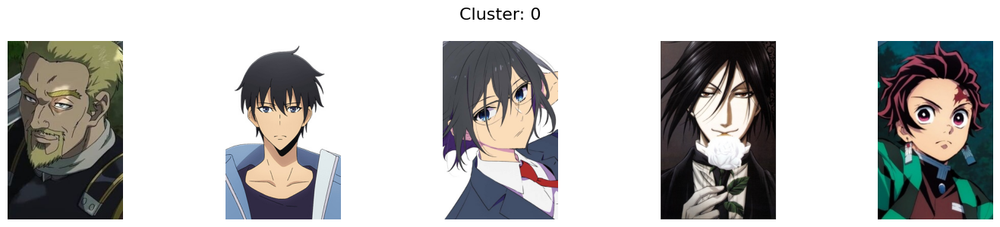

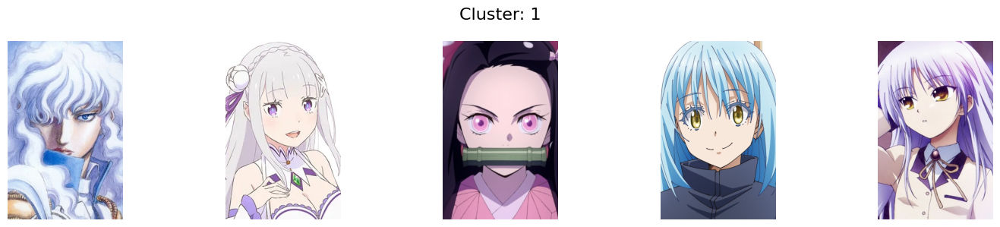

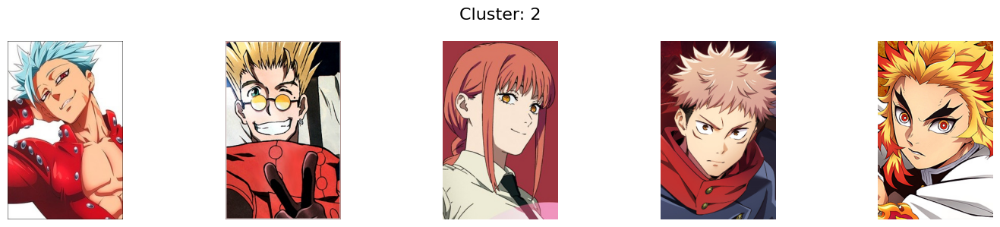

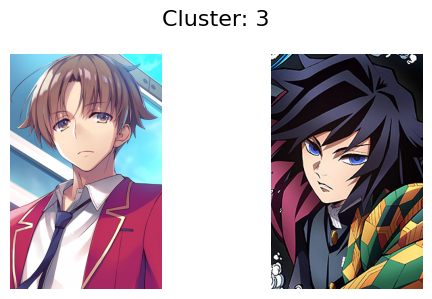

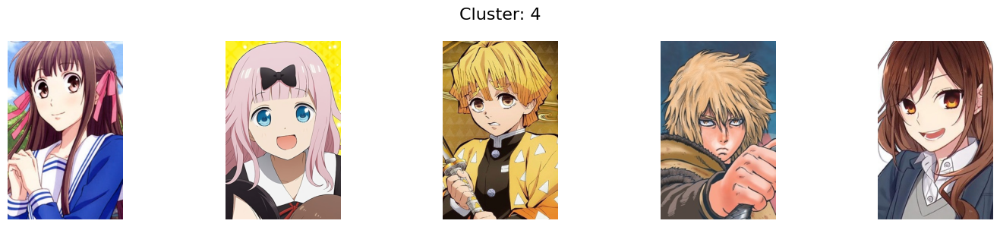

In [2]:
df = pd.read_csv("5_cluster_character.csv")
df = df.drop(columns="Unnamed: 0")

main(df)

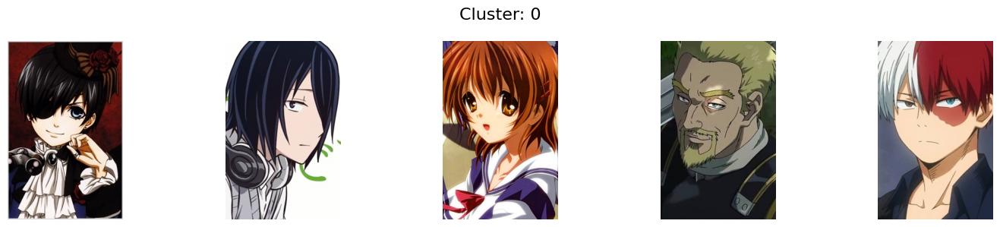

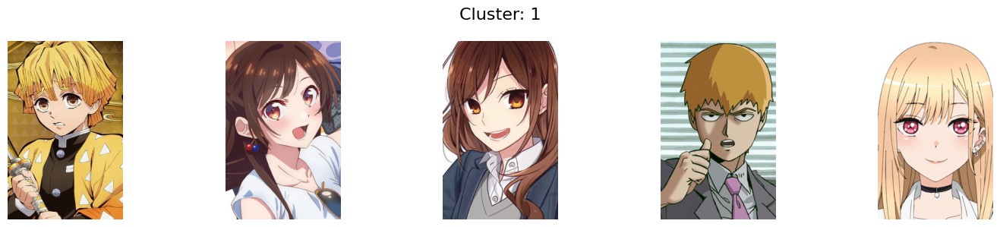

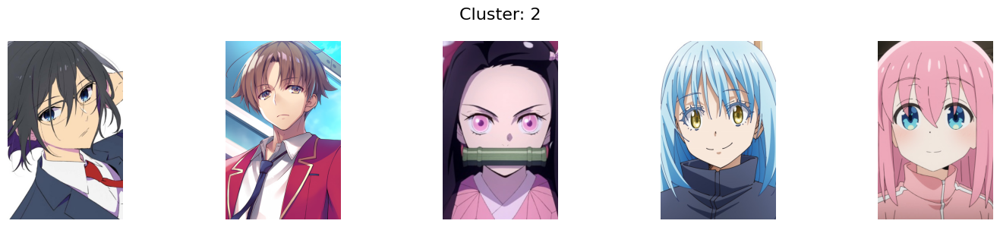

In [3]:
df = pd.read_csv("3_cluster_character.csv")
df = df.drop(columns="Unnamed: 0")
main(df)

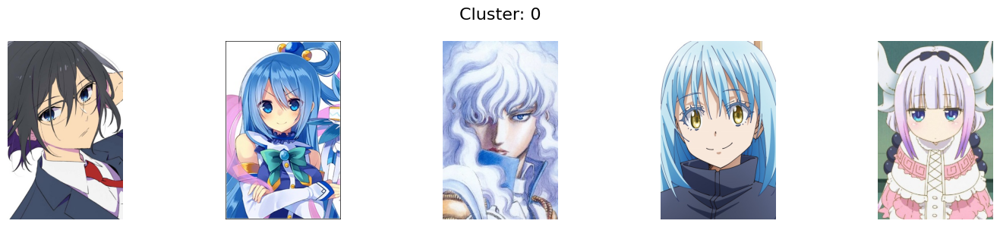

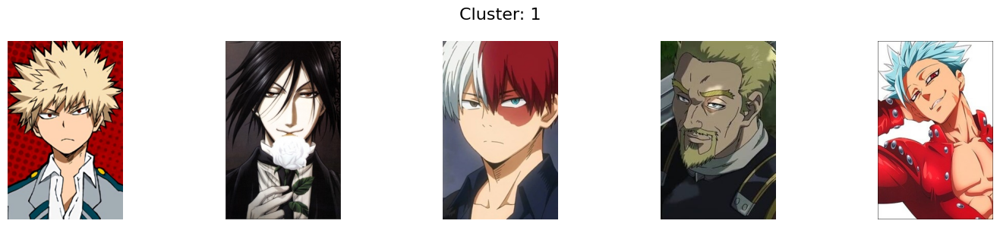

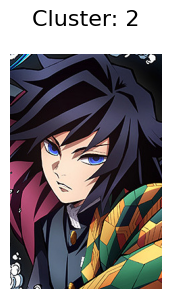

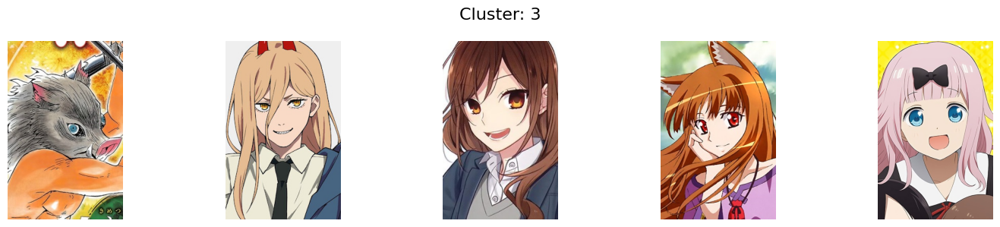

In [ ]:
df = pd.read_csv("4_cluster_character.csv")
df = df.drop(columns="Unnamed: 0")
main(df)

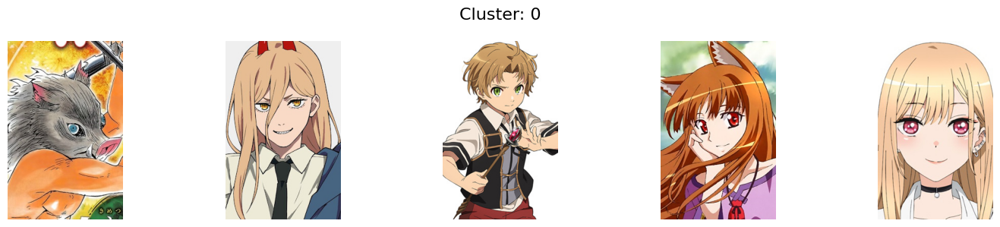

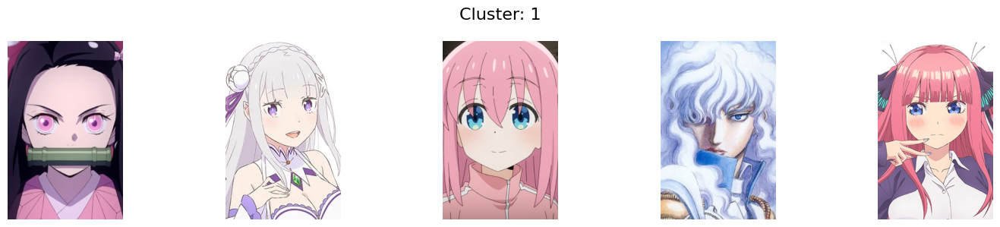

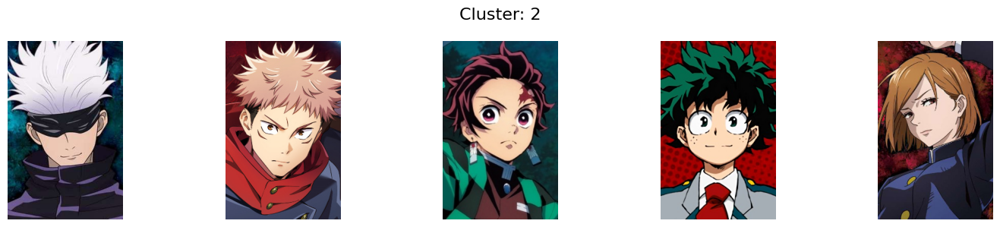

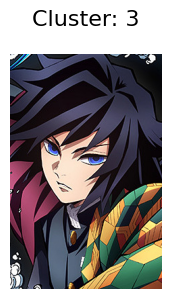

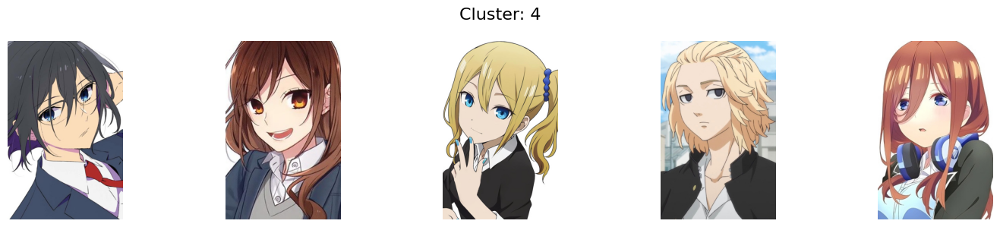

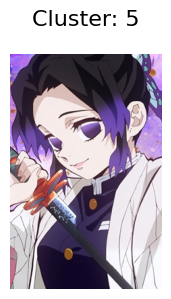

In [5]:
df = pd.read_csv("6_cluster_character.csv")
df = df.drop(columns="Unnamed: 0")
main(df)

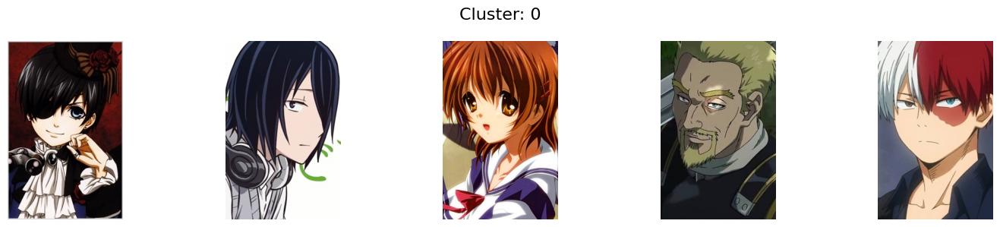

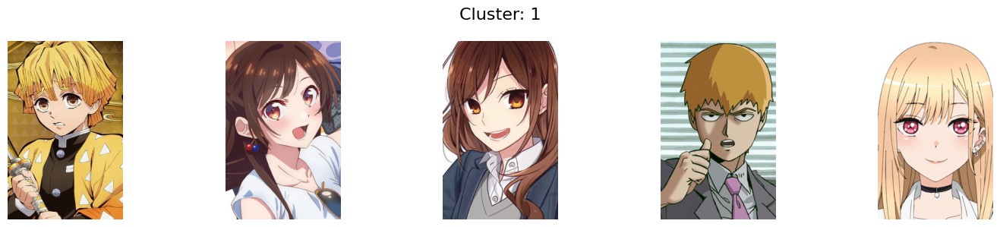

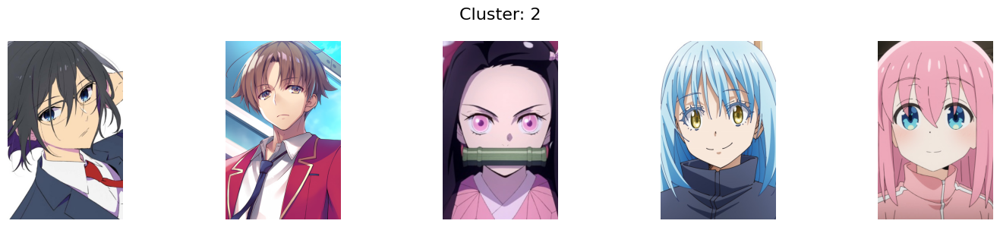

In [10]:
df = pd.read_csv("3_cluster_character.csv")
df = df.drop(columns="Unnamed: 0")
main(df)

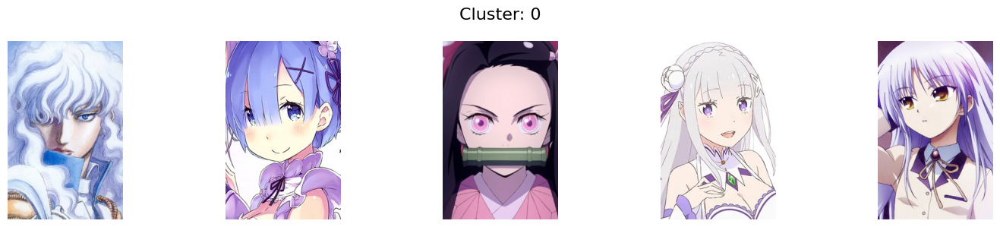

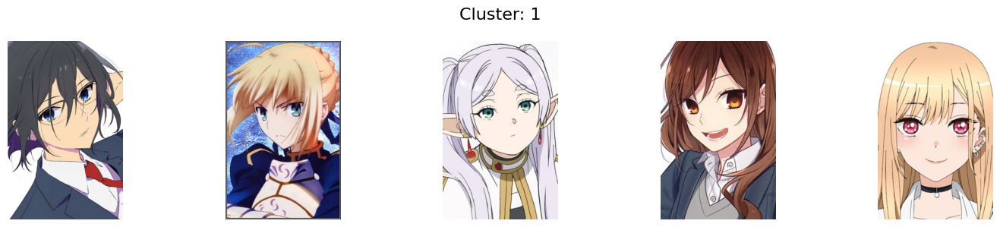

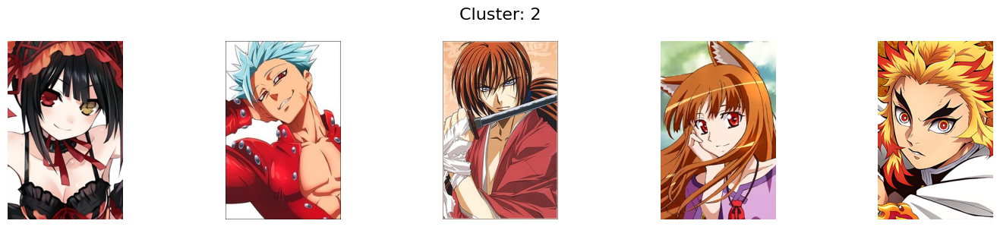

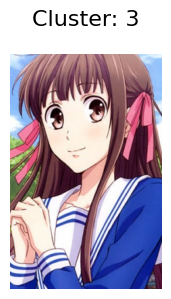

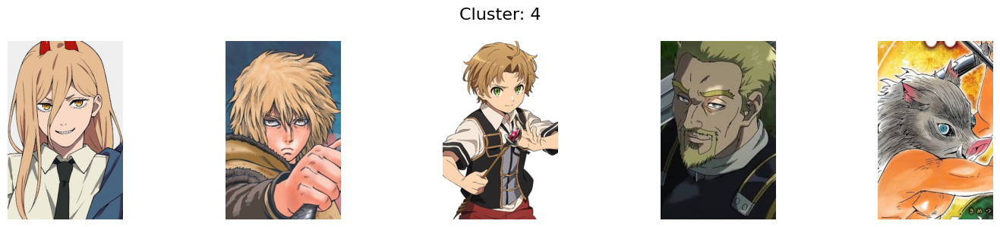

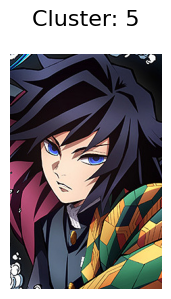

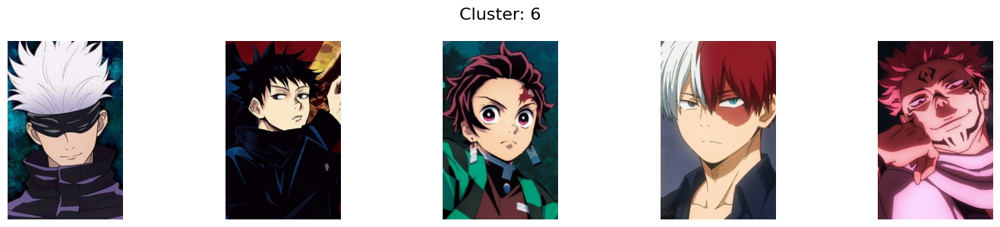

In [6]:
df = pd.read_csv("7_cluster_character.csv")
df = df.drop(columns="Unnamed: 0")
df = df.dropna()
main(df)

In [9]:
import pandas as pd

df_selected = pd.read_csv("7_cluster_character.csv")
df_selected = df_selected.drop(columns="Unnamed: 0")
df_selected = df_selected.dropna()

df_selected.head()

df_selected.to_csv("conclusion_char.csv")

In [11]:
from colorPallete import ColorPaletteExtractor

extractor = ColorPaletteExtractor()

In [ ]:
for cluster_id in df_selected['cluster'].unique():
    df = df_selected.loc[df_selected.cluster == cluster_id]
    
    try:
        for _, char in df.iterrows():
            print(char.char_name)
            extractor.load_image_from_url(char.img)
            extractor.extract_palette(num_clusters=30)
            extractor.display_palette(character_name=char.char_name)
            
        # Uncomment if you need to print the extracted palette
        # print("Extracted Palette (BGR format):")
        # print(extractor.get_palette())
    except Exception as e:
        print(f"Error in cluster {cluster_id}: {str(e)}")


Izumi Miyamura (宮村 伊澄)
